In [1]:
library(gprofiler2)

## From the `gprofiler2` vignette

In [2]:
gostres <- gost(query = c("X:1000:1000000", "rs17396340", "GO:0005005", "ENSG00000156103", "NLRP1"),
organism = "hsapiens")
head(gostres$result)

,query,significant,p_value,term_size,query_size,intersection_size,precision,recall,term_id,source,term_name,effective_domain_size,source_order,parents
,<chr>,<lgl>,<dbl>,<int>,<int>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<int>,<int>,<list>
1,query_1,TRUE,1.836335e-35,52,22,16,0.7272727,0.30769231,GO:0048013,GO:BP,ephrin receptor signaling pathway,21029,14506,GO:0007169
2,query_1,TRUE,3.593232e-24,233,22,16,0.7272727,0.06866953,GO:0007411,GO:BP,axon guidance,21029,3287,"GO:0007409, GO:0097485"
3,query_1,TRUE,3.855909e-24,234,22,16,0.7272727,0.06837607,GO:0097485,GO:BP,neuron projection guidance,21029,21874,"GO:0006928, GO:0006935, GO:0048812"
4,query_1,TRUE,8.173312e-20,431,22,16,0.7272727,0.03712297,GO:0007409,GO:BP,axonogenesis,21029,3286,"GO:0048667, GO:0048812, GO:0061564"
5,query_1,TRUE,4.202569e-19,477,22,16,0.7272727,0.03354298,GO:0061564,GO:BP,axon development,21029,18272,GO:0031175
6,query_1,TRUE,5.399805e-18,559,22,16,0.7272727,0.02862254,GO:0048667,GO:BP,cell morphogenesis involved in neuron differentiation,21029,14982,"GO:0000904, GO:0048666"


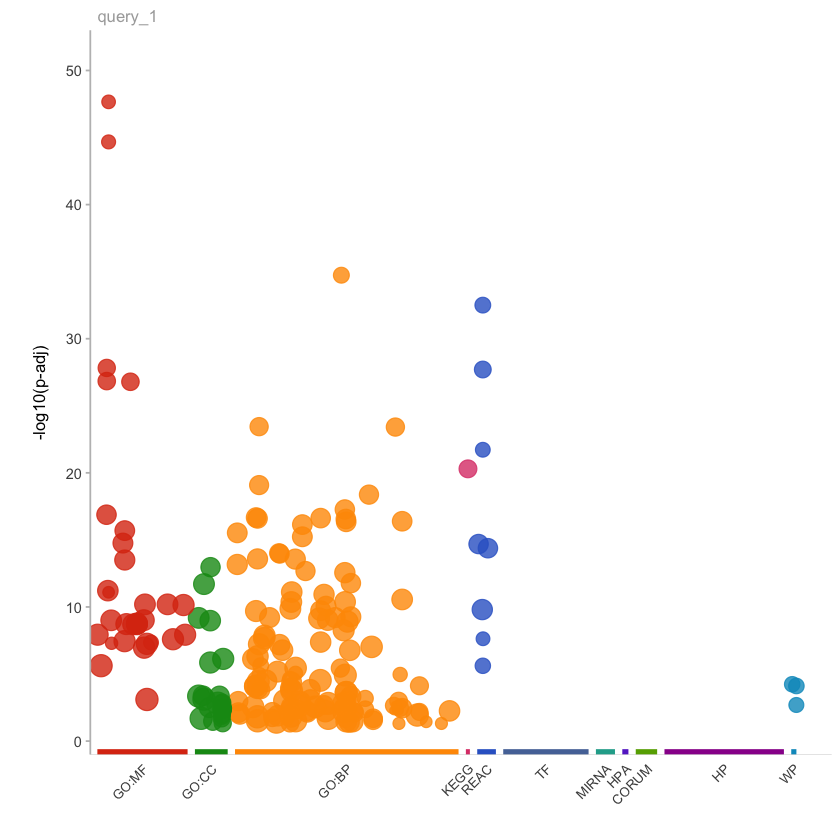

In [3]:
p <- gostplot(gostres, capped = FALSE, interactive = FALSE)
p

## Our data

Drug-target network

In [4]:
fpath <- "../../results/2021-10-24-chembl-query/chembl-avg_p_activities-phase_3_4-avg_p_act_5plus-v2.csv"
dtn <- read.csv(fpath, stringsAsFactors = FALSE)
dtn <- subset(dtn, select = c("drug_chembl_id", "target_uniprot_ac"))
head(dtn)

,drug_chembl_id,target_uniprot_ac
,<chr>,<chr>
1,CHEMBL1000,P35367
2,CHEMBL1002,P07550
3,CHEMBL1002,P10635
4,CHEMBL1002,P16473
5,CHEMBL1002,P19838
6,CHEMBL1002,Q16665


Reformat to a named list of vectors of UniProt ACs.

In [5]:
dtnl <- aggregate(dtn$target_uniprot_ac, list(dtn$drug_chembl_id), FUN=function(x) return(c(as.character(x))))
names(dtnl$x) <- dtnl$Group.1
dtnl$x[1:4]

$CHEMBL1000
[1] "P35367"

$CHEMBL1002
[1] "P07550" "P10635" "P16473" "P19838" "Q16665"

$CHEMBL100259
[1] "O00337" "O75496" "P32320" "Q9HAS3"

$CHEMBL1004
[1] "P39748" "Q96KQ7"

Read the ranking of top drugs.  Append UniProt ACs from list.

In [6]:
ranking <- read.csv("../../results/2022-01-14-top-drugs/ranked-drugs.csv")
ranking <- subset(ranking, select = c("drug_chembl_id", "drug_name", "max_phase", "indication_class", "uniprot_name", "max_phase_for_AD", "aggregate.rank"))
rownames(ranking) <- ranking$drug_chembl_id
ranking$uniprot_ac <- I(dtnl$x[rownames(ranking)])
head(ranking)

,drug_chembl_id,drug_name,max_phase,indication_class,uniprot_name,max_phase_for_AD,aggregate.rank,uniprot_ac
,<fct>,<fct>,<int>,<fct>,<fct>,<dbl>,<dbl>,<I<named list>>
CHEMBL477772,CHEMBL477772,PAZOPANIB,4,,BMR1B|PK3CD|PLK4|STK25|P3C2B|RIOK3|MP2K7|CHK1|IKKB|CSKP|AURKA|GAK|DCLK1|IKKA|MUSK|EPHB6|MK13|MRP4|PDPK1|M3K13|DAPK3|M3K7|RIPK2|NUAK1|PI51C|JAK2|STK16|P3C2G|PAK3|CDKL5|ST17B|STK10|CDK14|OXSR1|M4K4|CHK2|ABL1|RAF1|ERBB2|NTRK1|LCK|FYN|FES|CSF1R|YES|LYN|RET|IGF1R|MET|ROS1|PGFRB|FGR|WEE2|SBK3|KIT|FGFR1|SRC|INSRR|BRAF|PGFRA|FER|KAPCA|VGFR1|E2AK2|MAK|CD11B|FGFR2|ERBB3|ACES|FGFR4|FGFR3|KPCL|AVR2A|MARK3|EPHA3|EPHA8|LTK|UFO|MK04|GRK4|TTK|GRK5|TIE1|VGFR3|VGFR2|FLT3|ACVL1|TGFR2|PK3CA|PK3CB|MTOR|MATK|TXK|ABL2|FRK|ZAP70|MK08|MK09|MP2K4|PK3CG|CDK8|CLK3|CDK9|BLK|BMX|PRKX|NEK2|NEK4|JAK3|MP2K6|DAPK1|LIMK1|LIMK2|MK12|MK10|AAPK2|EPHB1|HUNK|SIK1|RIPK4|CSK21|PI42B|SRPK2|M3K9|CDKL1|CDK5|CDK16|KPCE|MP2K1|TIE2|M3K10|KPCT|TYRO3|CDK18|ACK1|DDR1|ITK|DMPK|M4K2|M3K12|MERTK|AAPK1|PAK1|MP2K5|M3K1|KGP2|TNK1|PRP4B|RIPK1|KCC2B|DYR1A|AVR2B|PTK6|KCC1A|IKKE|KPCD1|STK38|ERBB4|KS6A2|GRK1|NTRK3|M3K11|NTRK2|MK06|PHKG1|DDR2|AAK1|SBK1|M3K19|TNI3K|LRRK2|NEK5|DUSTY|M3K15|TAOK1|TLK2|ST32C|PIM3|VRK2|MYLK4|HIPK1|KCC1D|M4K3|CDKL3|BRSK2|NIM1|ULK2|DCLK2|KKCC1|KC1AL|HIPK4|MYO3A|ANKK1|NEK11|PI42C|BRSK1|STK35|NEK7|GRK7|ST32A|MYO3B|DYRK2|CDKL2|M4K1|SGK3|COQ8B|AURKB|KCC1G|CDK15|SRPK1|PI51A|RIOK1|MKNK1|RIOK2|CDK19|TRPM6|TSSK1|STK33|DCLK3|MYLK2|SLK|TAOK3|HIPK2|SRMS|HIPK3|PLK3|CLK4|MKNK2|NEK6|SNRK|LATS2|STK36|ST32B|PLK2|MARK1|PAK5|E2AK4|NLK|PI4KB|ST17A|STK39|EPHA6|TBK1|DAPK2|TNIK|TLK1|TAOK2|ALK|SRPK3|CD11A|AURKC|KCC2A|MAST1|M3K2|DYR1B|M4K5|RIPK3|IRAK3,NA,1,"O00238, ...."
CHEMBL491473,CHEMBL491473,CEDIRANIB,3,,CDC7|PK3CD|EF2K|PLK4|STK25|P3C2B|RIOK3|MP2K7|IKKB|CSKP|AURKA|GAK|DCLK1|IKKA|MUSK|EPHB6|MK13|PDPK1|M3K13|DAPK3|M3K7|RIPK2|DYRK3|NUAK1|PI51C|JAK2|ERN1|KS6A5|P3C2G|PAK3|CDKL5|ST17B|STK10|KPCD3|CDK14|OXSR1|M4K4|CHK2|ABL1|EGFR|RAF1|ERBB2|NTRK1|KPCG|LCK|FYN|FES|CSF1R|YES|LYN|RET|IGF1R|MET|HCK|ROS1|PGFRB|FGR|WEE2|SBK3|KIT|BCR|FGFR1|SRC|INSRR|PGFRA|FER|VGFR1|E2AK2|MAK|CD11B|FGFR2|ERBB3|FGFR4|FGFR3|KPCL|AVR2A|EPHA2|EPHA3|EPHA8|LTK|TYK2|UFO|MK04|GRK4|GRK5|TIE1|VGFR3|VGFR2|MP2K2|FLT3|ACV1B|TGFR1|ACVL1|MTREX|PK3CA|PK3CB|MTOR|MATK|TXK|ABL2|FRK|ZAP70|KSYK|PK3CG|CDK8|KC1E|CDK9|BLK|BMX|PRKX|NEK4|JAK3|DAPK1|MK12|AAPK2|EPHB4|EPHB1|HUNK|SIK1|RIPK4|CSK21|PI42B|SRPK2|KC1G2|M3K9|CDKL1|KPCE|MP2K1|TIE2|M3K10|KPCT|ACVR1|RON|BTK|TYRO3|DDR1|ITK|DMPK|M4K2|M3K12|MERTK|PAK1|MP2K5|KGP2|PRP4B|RIPK1|KCC2B|PTK6|KGP1|KCC1A|IKKE|FAK2|MELK|KPCD1|STK38|ERBB4|KS6A2|EPHA7|GRK1|NTRK3|NTRK2|MAPK3|MK06|PHKG1|DDR2|SBK1|M3K19|TNI3K|LRRK2|NEK5|DUSTY|M3K15|TAOK1|TLK2|ST32C|PIM3|VRK2|MYLK4|HIPK1|KCC1D|M4K3|CDKL3|MAPK5|BRSK2|NIM1|ULK2|MINK1|DCLK2|KKCC1|KC1AL|HIPK4|MYO3A|ANKK1|NEK11|BRSK1|STK35|NEK7|GRK7|ST32A|MYO3B|DYRK2|CDKL2|M4K1|SGK3|COQ8B|AURKB|TOPK|KCC1G|TSSK2|CDK15|SRPK1|PI51A|E2AK1|RIOK1|MKNK1|RIOK2|CDK19|TRPM6|TSSK1|STK33|KPCD2|DCLK3|SIK2|MYLK2|SLK|HIPK2|SRMS|HIPK3|PLK3|MKNK2|SGK2|NEK6|DYRK4|SNRK|LATS2|STK36|ST32B|PLK2|MARK1|PIM2|PAK5|E2AK4|PI4KB|ST17A|STK39|EPHA6|TBK1|DAPK2|TNIK|TLK1|ACSL5|ALK|SRPK3|CD11A|AURKC|KCC2A|ST38L|MAST1|DYR1B|M4K5|STK24,NA,2,"O00311, ...."
CHEMBL939,CHEMBL939,GEFITINIB,4,,CDC7|EF2K|PLK4|STK25|P3C2B|CTRO|RIOK3|MP2K7|IKKB|CSKP|AURKA|GAK|DCLK1|IKKA|MUSK|EPHB6|MK13|MRP4|PDPK1|M3K13|DAPK3|M3K7|RIPK2|DYRK3|NUAK1|PI51C|JAK2|KS6A5|KS6A4|P3C2G|PAK3|CDKL5|ST17B|STK10|KPCD3|CDK14|OXSR1|M4K4|PAK4|CHK2|ABL1|EGFR|LMNA|RAF1|ERBB2|NTRK1|KPCG|LCK|FYN|FES|CSF1R|YES|LYN|RET|IGF1R|MET|HCK|ROS1|PGFRB|FGR|WEE2|SBK3|KIT|PIM1|FGFR1|SRC|INSRR|PHKG2|PGFRA|FER|KAPCA|VGFR1|E2AK2|MAK|CD11B|EPHA1|FGFR2|ERBB3|FGFR4|FGFR3|HEMH|KS6B1|KPCL|AVR2A|EPHA2|EPHA3|EPHA8|LTK|TYK2|UFO|MK04|GRK4|GRK5|TIE1|VGFR3|VGFR2|FLT3|ACVL1|KPCI|MATK|TXK|ABL2|FRK|ZAP70|KSYK|MK08|MK09|KC1D|CDK8|KC1E|CLK3|CDK7|CDK9|BLK|IRAK1|KS6A3|BMX|PRKX|NEK4|JAK3|DAPK1|LIMK1|MK12|MK10|AAPK2|EPHA5|EPHB4|EPHB1|HUNK|SIK1|RIPK4|CSK21|PI42B|SRPK2|M3K9|CDKL1|KPCE|MP2K1|TIE2|M3K10|KPCT|ACVR1|FAK1|BTK|TYRO3|CDK18|ACK1|ITK|DMPK|M4K2|M3K12|MERTK|AAPK1|PAK1|MP2K5|KGP2|PRP4B|

In [7]:
indications <- read.csv("../../results/2021-12-13-chembl-drug-info/drug-indication.csv")
head(indications)

,drug_chembl_id,drug_name,mesh_id,mesh_heading,efo_id,efo_term,max_phase_for_ind
,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<int>
1,CHEMBL1000,CETIRIZINE,D008881,Migraine Disorders,EFO:0003821,migraine disorder,1
2,CHEMBL1000,CETIRIZINE,D009471,Neuromyelitis Optica,EFO:0004256,neuromyelitis optica,1
3,CHEMBL1000,CETIRIZINE,D012220,Rhinitis,EFO:0008521,rhinitis,2
4,CHEMBL1000,CETIRIZINE,D003233,"Conjunctivitis, Allergic",EFO:0007141,allergic conjunctivitis,3
5,CHEMBL1000,CETIRIZINE,D003872,Dermatitis,MONDO:0002406,dermatitis,3
6,CHEMBL1000,CETIRIZINE,D003876,"Dermatitis, Atopic",EFO:0000274,atopic eczema,3


In [8]:
ADdrugs <- subset(indications, mesh_id == "D000544")
rownames(ADdrugs) <- ADdrugs$drug_chembl_id
#head(ADdrugs[rownames(ranking), "max_phase_for_ind"], n = 30)
ADdrugs$target_uniprot_ac <- I(dtnl$x[rownames(ADdrugs)])
ADdrugs

,drug_chembl_id,drug_name,mesh_id,mesh_heading,efo_id,efo_term,max_phase_for_ind,target_uniprot_ac
,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<int>,<I<named list>>
CHEMBL1017,CHEMBL1017,TELMISARTAN,D000544,Alzheimer Disease,EFO:0000249,Alzheimer's disease,2,"O75604, ...."
CHEMBL1023,CHEMBL1023,BEXAROTENE,D000544,Alzheimer Disease,EFO:0000249,Alzheimer's disease,2,"O00255, ...."
CHEMBL103,CHEMBL103,PROGESTERONE,D000544,Alzheimer Disease,EFO:0000249,Alzheimer's disease,3,"O15245, ...."
CHEMBL10316,CHEMBL10316,IDAZOXAN,D000544,Alzheimer Disease,EFO:0000249,Alzheimer's disease,0,"P08913, ...."
CHEMBL106,CHEMBL106,FLUCONAZOLE,D000544,Alzheimer Disease,EFO:0000249,Alzheimer's disease,1,"O75496, ...."
CHEMBL1064,CHEMBL1064,SIMVASTATIN,D000544,Alzheimer Disease,EFO:0000249,Alzheimer's disease,3,"O75496, ...."
CHEMBL1083390,CHEMBL1083390,INTEPIRDINE,D000544,Alzheimer Disease,EFO:0000249,Alzheimer's disease,3,"P08908, ...."
CHEMBL1083659,CHEMBL1083659,SUVOREXANT,D000544,Alzheimer Disease,EFO:0000249,Alzheimer's disease,2,"O43613, ...."
CHEMBL109,CHEMBL109,VALPROIC ACID,D000544,Alzheimer Disease,EFO:0000249,Alzheimer's disease,0,"P10828, ...."


In [9]:
genes.at.phase <- function(phase, ADdrugs = ADdrugs, uniqGenes = TRUE) {
    d <- subset(ADdrugs, max_phase_for_ind == phase, "target_uniprot_ac")
    val <- unlist(d)
    if (uniqGenes)
        val <- unique(val)
    names(val) <- NULL
    return(val)
}

targets.ADdrugs <- lapply(0:4, function(x) genes.at.phase(x, ADdrugs))
names(targets.ADdrugs) <- 0:4
sapply(targets.ADdrugs, length)

0   1   2   3   4 
 30 460 486 401   2

In [10]:
enrich.ADdrugs.1 <- gost(query = targets.ADdrugs[['1']], organism = "hsapiens", evcodes = TRUE)
head(enrich.ADdrugs.1$result)

,query,significant,p_value,term_size,query_size,intersection_size,precision,recall,term_id,source,term_name,effective_domain_size,source_order,parents,evidence_codes,intersection
,<chr>,<lgl>,<dbl>,<int>,<int>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<int>,<int>,<list>,<chr>,<chr>
1,query_1,TRUE,0.001871989,7,163,5,0.03067485,0.7142857,CORUM:1505,CORUM,NCOR2 complex,3627,767,CORUM:0000000,"CORUM,CORUM,CORUM,CORUM,CORUM","O15379,O75376,Q13547,Q92769,Q9Y618"
2,query_1,TRUE,0.002187280,4,163,4,0.02453988,1.0000000,CORUM:6842,CORUM,EphA1 receptor signaling complex,3627,2409,CORUM:0000000,"CORUM,CORUM,CORUM,CORUM","P06239,P21709,Q14289,P27986"
3,query_1,TRUE,0.049541896,3,163,3,0.01840491,1.0000000,CORUM:7462,CORUM,"GABA-A receptor (GABRA1, GABRB2, GABRD)",3627,2850,CORUM:0000000,"CORUM,CORUM,CORUM","O14764,P14867,P47870"
4,query_1,TRUE,0.049541896,3,163,3,0.01840491,1.0000000,CORUM:7461,CORUM,"GABA-A receptor (GABRA1, GABRB2, GABRG2)",3627,2849,CORUM:0000000,"CORUM,CORUM,CORUM","P14867,P18507,P47870"
5,query_1,TRUE,0.049541896,3,163,3,0.01840491,1.0000000,CORUM:5844,CORUM,I-kappa-B kinase complex,3627,1828,CORUM:0000000,"CORUM,CORUM,CORUM","O14920,O15111,Q9Y6K9"
6,query_1,TRUE,0.049541896,3,163,3,0.01840491,1.0000000,CORUM:5809,CORUM,"GABA-A receptor (GABRA1, GABRB2, GABRG2)",3627,1815,CORUM:0000000,"CORUM,CORUM,CORUM","P14867,P18507,P47870"


In [11]:
#options(repr.plot.width=4, repr.plot.height=3)
gostplot(enrich.ADdrugs.1)

Warning message:
“`gather_()` was deprecated in tidyr 1.2.0.
Please use `gather()` instead.
This warning is displayed once every 8 hours.
Call `lifecycle::last_lifecycle_warnings()` to see where this warning was generated.”


HTML widgets cannot be represented in plain text (need html)

In [12]:
enrich.ADdrugs <- gost(query = targets.ADdrugs, organism = "hsapiens", evcodes = TRUE)

In [13]:
gostplot(enrich.ADdrugs)

HTML widgets cannot be represented in plain text (need html)

In [15]:
sessionInfo()

R version 3.6.3 (2020-02-29)
Platform: x86_64-apple-darwin15.6.0 (64-bit)
Running under: macOS  10.16

Matrix products: default
BLAS:   /Library/Frameworks/R.framework/Versions/3.6/Resources/lib/libRblas.0.dylib
LAPACK: /Library/Frameworks/R.framework/Versions/3.6/Resources/lib/libRlapack.dylib

locale:
[1] en_US.UTF-8/en_US.UTF-8/en_US.UTF-8/C/en_US.UTF-8/en_US.UTF-8

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
[1] gprofiler2_0.2.1

loaded via a namespace (and not attached):
 [1] pillar_1.7.0      compiler_3.6.3    bitops_1.0-7      base64enc_0.1-3  
 [5] tools_3.6.3       digest_0.6.29     uuid_1.1-0        viridisLite_0.4.0
 [9] jsonlite_1.8.0    evaluate_0.15     lifecycle_1.0.1   tibble_3.1.7     
[13] gtable_0.3.0      pkgconfig_2.0.3   rlang_1.0.2       IRdisplay_1.1    
[17] cli_3.3.0         crosstalk_1.2.0   yaml_2.3.5        IRkernel_1.3     
[21] fastmap_1.1.0     httr_1.4.3        repr_1.1.4   